### Настройка ноутбука в Google Colab.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import statistics
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
import math
import time
%matplotlib inline

### Задача Python ML
Необходимо построить модель прогнозирования оттока клиентов по имеющимся признакам (колонка churn в файле – целевая переменная), кратко описать методику подготовки данных, построения модели и оценки её качества. Желательно провести анализ полученных результатов и оценить практическую применимость модели.
Результат может быть представлен, например, в виде jupyter-ноутбука с кодом. Данные находятся в приложенном файле.

In [ ]:
tc = pd.read_csv("/content/drive/My Drive/Colab Notebooks/telecom_churn/telco-customer-churn.csv")
tc.sample(5)

,age,annualincome,calldroprate,callfailurerate,callingnum,customerid,customersuspended,education,gender,homeowner,...,totalminsusedinlastmonth,unpaidbalance,usesinternetservice,usesvoiceservice,percentagecalloutsidenetwork,totalcallduration,avgcallduration,churn,year,month
6670,77,249118,0.05,0.00,4251051110,3093,Yes,High School or below,Female,Yes,...,81,196,No,No,0.31,4872,812,0,2015,1
18174,28,6612,0.04,0.02,4251043095,8457,Yes,High School or below,Male,No,...,222,96,No,No,0.01,4019,669,1,2015,1
2596,40,105512,0.05,0.01,4251067066,1206,Yes,High School or below,Male,Yes,...,294,216,Yes,No,0.25,2704,540,0,2015,1
5214,30,5808,0.02,0.00,4251062209,2417,Yes,High School or below,Male,Yes,...,482,188,No,Yes,0.05,5066,723,0,2015,2
3132,64,112754,0.05,0.00,4251048207,1454,Yes,Master or equivalent,Male,Yes,...,132,214,No,No,0.97,3481,696,0,2015,1


In [ ]:
tc.columns

Index(['age', 'annualincome', 'calldroprate', 'callfailurerate', 'callingnum',
       'customerid', 'customersuspended', 'education', 'gender', 'homeowner',
       'maritalstatus', 'monthlybilledamount', 'noadditionallines',
       'numberofcomplaints', 'numberofmonthunpaid',
       'numdayscontractequipmentplanexpiring', 'occupation', 'penaltytoswitch',
       'state', 'totalminsusedinlastmonth', 'unpaidbalance',
       'usesinternetservice', 'usesvoiceservice',
       'percentagecalloutsidenetwork', 'totalcallduration', 'avgcallduration',
       'churn', 'year', 'month'],
      dtype='object')

Сначала сделаю **pandas-profiling**.  
Удобная вещь, запускается и в облаке.  
Потом опишу таблицу классическими методами.

In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
tc_profile = ProfileReport(tc, title = 'telco-customer-churn', html = {'style':{'full_width':True}})

In [ ]:
tc_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Что бросается в первую очередь.**

Удалить:  
**noadditionallines, year**  
**customerid** - Просто некая нумерация пользователей сквозная, всеровно можно всегда восстановить.

Много нулевых значений у переменных:  
**calldroprate**  
**numberofmonthunpaid**

Есть нулевые значения у  
**numdayscontractequipmentplanexpiring** 

Эти данные имеют смысл (нулевые значения), ниже рассмотрено, что они из себя представляют, надо оставлять.

Интересно, как поведут себя фичи, которые имеют  **положительную корреляцию** к целевой переменной 'churn':  
**numberofcomplaints, unpaidbalance**

In [ ]:
tc.shape

(20468, 29)

**У нас 29-переменных в таблице. 28-фичей и 1 целевая переменная.  
Всего 20468 данных.**  

In [ ]:
tc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20468 entries, 0 to 20467
Data columns (total 29 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   age                                   20468 non-null  int64  
 1   annualincome                          20468 non-null  int64  
 2   calldroprate                          20468 non-null  float64
 3   callfailurerate                       20468 non-null  float64
 4   callingnum                            20468 non-null  int64  
 5   customerid                            20468 non-null  int64  
 6   customersuspended                     20468 non-null  object 
 7   education                             20468 non-null  object 
 8   gender                                20468 non-null  object 
 9   homeowner                             20468 non-null  object 
 10  maritalstatus                         20468 non-null  object 
 11  monthlybilledam

Распишем, сколько у нас категориальных переменных, сколько числовых.

In [ ]:
tc_categorical_columns = [c for c in tc.columns if tc[c].dtype.name == 'object']
tc_numerical_columns   = [c for c in tc.columns if tc[c].dtype.name != 'object']
len(tc_categorical_columns), tc_categorical_columns, len(tc_numerical_columns), tc_numerical_columns

(10,
 ['customersuspended',
  'education',
  'gender',
  'homeowner',
  'maritalstatus',
  'noadditionallines',
  'occupation',
  'state',
  'usesinternetservice',
  'usesvoiceservice'],
 19,
 ['age',
  'annualincome',
  'calldroprate',
  'callfailurerate',
  'callingnum',
  'customerid',
  'monthlybilledamount',
  'numberofcomplaints',
  'numberofmonthunpaid',
  'numdayscontractequipmentplanexpiring',
  'penaltytoswitch',
  'totalminsusedinlastmonth',
  'unpaidbalance',
  'percentagecalloutsidenetwork',
  'totalcallduration',
  'avgcallduration',
  'churn',
  'year',
  'month'])

Распишем численные типы на int и float:  

In [ ]:
tc_int64_columns   = [c for c in tc.columns if tc[c].dtype.name == 'int64']
tc_float64_columns   = [c for c in tc.columns if tc[c].dtype.name == 'float64']
len(tc_int64_columns), tc_int64_columns, len(tc_float64_columns), tc_float64_columns

(16,
 ['age',
  'annualincome',
  'callingnum',
  'customerid',
  'monthlybilledamount',
  'numberofcomplaints',
  'numberofmonthunpaid',
  'numdayscontractequipmentplanexpiring',
  'penaltytoswitch',
  'totalminsusedinlastmonth',
  'unpaidbalance',
  'totalcallduration',
  'avgcallduration',
  'churn',
  'year',
  'month'],
 3,
 ['calldroprate', 'callfailurerate', 'percentagecalloutsidenetwork'])

In [ ]:
tc[tc_categorical_columns].describe()

,customersuspended,education,gender,homeowner,maritalstatus,noadditionallines,occupation,state,usesinternetservice,usesvoiceservice
count,20468,20468,20468,20468,20468,20468,20468,20468,20468,20468
unique,2,4,2,2,2,1,3,50,2,2
top,Yes,High School or below,Female,Yes,Single,\N,Others,HI,No,No
freq,20026,10217,10474,16380,10446,20468,8189,478,19675,18598


Изучим **категориальные переменные**.  
Как мы выяснили всего десять категориальных переменных.

['customersuspended',
  'education',
  'gender',
  'homeowner',
  'maritalstatus',
  'noadditionallines',
  'occupation',
  'state',
  'usesinternetservice',
  'usesvoiceservice']

1 **customersuspended** - клиент отложен.  
Дисбаланс классов.

In [ ]:
tc.customersuspended.nunique(), tc.customersuspended.unique()

(2, array(['Yes', 'No'], dtype=object))

In [ ]:
tc.customersuspended.value_counts()

Yes    20026
No       442
Name: customersuspended, dtype: int64

2 **education** - образование  
В колонке четыре уникальных значения.

In [ ]:
tc.education.nunique(), tc.education.unique()

(4, array(['Bachelor or equivalent', 'Master or equivalent',
        'PhD or equivalent', 'High School or below'], dtype=object))

In [ ]:
tc.education.value_counts()

High School or below      10217
Bachelor or equivalent     6138
Master or equivalent       3099
PhD or equivalent          1014
Name: education, dtype: int64

3 **gender**  пол  
Раз, два, всё как у людей.  
Всех по паре, равномерное распределение по классам.

In [ ]:
tc.gender.nunique(), tc.gender.unique()

(2, array(['Male', 'Female'], dtype=object))

In [ ]:
tc.gender.value_counts()

Female    10474
Male       9994
Name: gender, dtype: int64

4 **homeowner** - Владение домом.  
Характеризует насколько состоятельный клиент.

In [ ]:
tc.homeowner.nunique(), tc.homeowner.unique()

(2, array(['Yes', 'No'], dtype=object))

In [ ]:
tc.homeowner.value_counts()

Yes    16380
No      4088
Name: homeowner, dtype: int64

80 % владеют домом, прям закон Парето.

5 **maritalstatus** - холост / женат(замужем)  
Здесь, как и распределение по полу, равномерное распределение по классам.

In [ ]:
tc.maritalstatus.nunique(), tc.maritalstatus.unique()

(2, array(['Single', 'Married'], dtype=object))

In [ ]:
tc.maritalstatus.value_counts()

Single     10446
Married    10022
Name: maritalstatus, dtype: int64

6 **noadditionallines** - никаких дополительных линий.  
**Ура.** Здесь все ячейки заполнены одним значением, нужно **обязательно** удалить эту колонку!

In [ ]:
tc.noadditionallines.nunique(), tc.noadditionallines.unique()

(1, array(['\\N'], dtype=object))

In [ ]:
tc.noadditionallines.value_counts()

\N    20468
Name: noadditionallines, dtype: int64

 7 **occupation** - тип занятости.  
 Очень интересно! Мне эта колонка рассказала, что явно кто-то уже обрабатывал этот датасет, потому что здесь есть значение Others.  
 В принципе, два основных значения имеют равномерное распределение. Others чуть больше.

In [ ]:
tc.occupation.nunique(), tc.occupation.unique()

(3, array(['Technology Related Job', 'Non-technology Related Job', 'Others'],
       dtype=object))

In [ ]:
tc.occupation.value_counts()

Others                        8189
Non-technology Related Job    6189
Technology Related Job        6090
Name: occupation, dtype: int64

 8 **state** - штаты.  
 Всего 50 штатов.

In [ ]:
tc.state.nunique(), tc.state.unique()

(50, array(['WA', 'WI', 'KS', 'KY', 'ND', 'OK', 'AZ', 'CA', 'MI', 'MN', 'SC',
        'TN', 'FL', 'HI', 'NV', 'NH', 'VA', 'WV', 'IA', 'OH', 'AK', 'AR',
        'MA', 'SD', 'DE', 'GA', 'NE', 'IN', 'NC', 'MD', 'RI', 'MT', 'VT',
        'CO', 'MO', 'UT', 'ID', 'NM', 'WY', 'LA', 'OR', 'MS', 'TX', 'NJ',
        'NY', 'AL', 'PA', 'CT', 'IL', 'ME'], dtype=object))

In [ ]:
tc_state = tc.state.value_counts()
tc_state

HI    478
MD    469
NY    468
AK    461
FL    459
NH    455
WY    454
MN    451
KY    450
AZ    450
CA    449
PA    448
WA    444
CO    442
MT    442
WI    440
TX    437
OH    435
ND    427
SD    427
UT    425
IN    423
DE    423
IA    418
ID    411
VA    407
SC    404
LA    400
MS    398
MA    398
NV    397
KS    395
OR    394
NM    390
MI    388
NJ    377
MO    377
IL    377
RI    376
VT    373
OK    372
NE    371
ME    361
NC    360
TN    356
WV    351
CT    350
GA    339
AR    337
AL    334
Name: state, dtype: int64

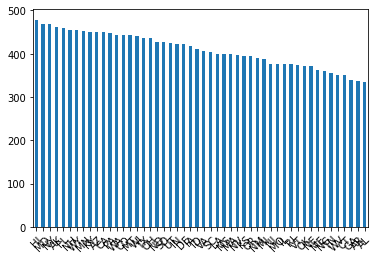

In [ ]:
tc_state.plot(kind='bar', rot=45)

  9 **usesinternetservice** - используют или нет клиенты интернет.  
  Два значения, в основном нет.

In [ ]:
tc.usesinternetservice.nunique(), tc.usesinternetservice.unique()

(2, array(['No', 'Yes'], dtype=object))

In [ ]:
tc.usesinternetservice.value_counts()

No     19675
Yes      793
Name: usesinternetservice, dtype: int64

10 **usesvoiceservice** - используют или нет клиенты голосовое.  
Тоже нет, примерно столько же, как и тех, кто не пользуются интернетом.

In [ ]:
tc.usesvoiceservice.nunique(), tc.usesvoiceservice.unique()

(2, array(['No', 'Yes'], dtype=object))

In [ ]:
tc.usesvoiceservice.value_counts()

No     18598
Yes     1870
Name: usesvoiceservice, dtype: int64

В принципе интересно посмотреть в будущем, как соотносятся те, кто пользуются интернетом и голосовым.

Изучим **числовые переменные**.  
Как мы выяснили всего девятнадцать числовых переменных.

Из них шестнадцать имеют int тип, три float тип.

In [ ]:
tc_int64_columns, tc_float64_columns

(['age',
  'annualincome',
  'callingnum',
  'customerid',
  'monthlybilledamount',
  'numberofcomplaints',
  'numberofmonthunpaid',
  'numdayscontractequipmentplanexpiring',
  'penaltytoswitch',
  'totalminsusedinlastmonth',
  'unpaidbalance',
  'totalcallduration',
  'avgcallduration',
  'churn',
  'year',
  'month'],
 ['calldroprate', 'callfailurerate', 'percentagecalloutsidenetwork'])

**int64**

1 **age** - это возраст, можно и категорией сделать...

In [ ]:
tc.age.nunique(), tc.age.unique()

(68, array([12, 42, 58, 20, 36, 67, 14, 45, 61, 23, 39, 69, 17, 48, 64, 26, 72,
        50, 66, 29, 75, 53, 31, 47, 78, 56, 34, 13, 28, 59, 37, 15, 62, 77,
        40, 18, 43, 21, 24, 70, 27, 73, 51, 76, 54, 32, 57, 35, 38, 16, 19,
        65, 22, 68, 46, 71, 49, 52, 30, 33, 79, 60, 63, 41, 44, 25, 74, 55]))

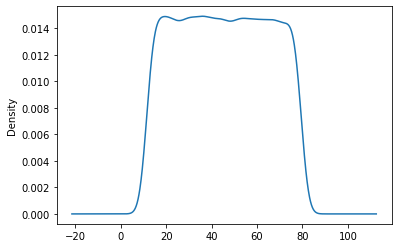

In [ ]:
tc.age.plot(kind='kde')

Равномерное распределение по возрасту.

In [ ]:
tc.age.min(), tc.age.max()

(12, 79)

2 **annualincome** - годовой доход

In [ ]:
tc.annualincome.nunique(), tc.annualincome.unique()

(9508, array([168147,  29047,  27076, ...,  67056,  65084, 120042]))

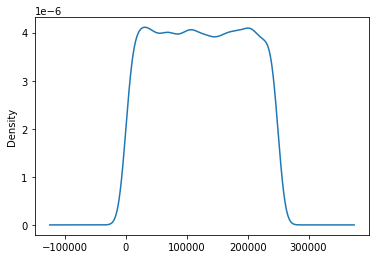

In [ ]:
tc.annualincome.plot(kind='kde')

In [ ]:
tc.annualincome.min(), tc.annualincome.max()

(4, 249987)

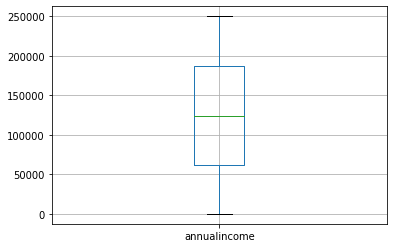

In [ ]:
tc.boxplot(column='annualincome')

In [ ]:
tc.annualincome[tc.annualincome < 10000]

42       9412
43       9412
44       7441
45       7441
165      5462
         ... 
20343    6723
20346    3766
20347    3766
20406    6947
20407    6947
Name: annualincome, Length: 818, dtype: int64

Хорошо, хоть нет отрицательного дохода, но мне не нравится, что есть довольно маленькие значения по годовому доходу. Надо посмотреть вблизи, что за значения, может удалить либо в определённую группу занести.

3 **callingnum** - номер звонка.

In [ ]:
tc.callingnum.nunique(), tc.callingnum.unique()

(9525, array([4251078442, 4251043419, 4251055773, ..., 4251050233, 4251050074,
        4251075688]))

In [ ]:
tc.callingnum.min(), tc.callingnum.max()

(102295480, 4251100406)

(4000000000.0, 4500000000.0)

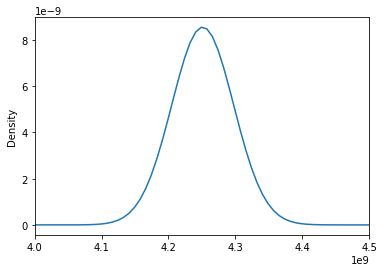

In [ ]:
tc.callingnum.plot(kind='kde')
plt.xlim([4*10**9, 4.5*10**9])

In [ ]:
tc_v = tc.callingnum.value_counts()
tc_v

4251030895    3
4251090035    3
4251088204    3
4251078513    3
4251056158    3
             ..
4251021975    1
4251094286    1
4251031454    1
4251038675    1
4251027717    1
Name: callingnum, Length: 9525, dtype: int64

In [ ]:
tc_v.unique()

array([3, 2, 1])

In [ ]:
len(tc_v[tc_v == 3]), len(tc_v[tc_v == 2]), len(tc_v[tc_v == 1])

(1513, 7917, 95)

4 **customerid** - id покупателя.  
Поскольку количество номеров телефона и количество покупателей равно, скорей всего у каждого покупателя свой номер телефона.  
Это такие уникальные переменные две, что скорей всего они не будут никак влиять на наши метрику, если только номер телефона какой-нибудь особенный.  
ЗДЕСЬ РЫБЫ НЕТ, я бы удалил этот столбец.

In [ ]:
tc.customerid.nunique(), tc.customerid.unique()

(9525, array([   1,    2,    3, ..., 9523, 9524, 9525]))

5 **monthlybilledamount** - ежемесячно сумма выставленного счёта.  
Мне кажется, что это искусственно созданная переменная, можно конечно посмотреть, насколько она важна.  

In [ ]:
tc.monthlybilledamount.nunique(), tc.monthlybilledamount.unique()

(120, array([ 71,   8,  16,  74,  81,  19,  27,  85,  92,  30,  37,  95, 103,
         41,  48, 106, 114,  52,  59, 117,   4,  62,  70,  15,  73,  18,
         26,  84,  91,  29, 102,  40,  47, 105, 113,  51,  58, 116,  69,
          7,  14,  72,  80, 109,  54,  61, 119,  65,  10,  75,  83,  21,
         28,  86,  94,  32,  39,  97, 104,  42,  50, 108, 115,  53,   6,
         64,   9,  17,  82,  20,  93,  31,  38,  96,  49, 107,  60, 118,
          5,  63,  25,  36, 101, 112,   3,  68,  79,  90,  35,  46, 111,
         57,   2,  13,  78,  24,  89, 100,  45,  56,   1,  67,  12,  23,
         88,  34,  99, 110,  55,  66,  77,  22,  33,  98,  44,   0,  11,
         76,  87,  43]))

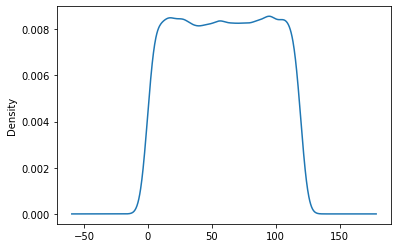

In [ ]:
tc.monthlybilledamount.plot(kind='kde')

In [ ]:
tc.monthlybilledamount.value_counts()

107    212
84     203
96     200
95     197
16     197
      ... 
1      146
81     143
51     140
70     140
11     132
Name: monthlybilledamount, Length: 120, dtype: int64

6 **numberofcomplaints** - количество жалоб.  
Важный показатель по своей сути.  
Всего 4 уникальных значения.  
От 'нет жалоб' до '3'.

In [ ]:
tc.numberofcomplaints.nunique(), tc.numberofcomplaints.unique()

(4, array([0, 1, 3, 2]))

In [ ]:
tc.numberofcomplaints.value_counts()

0    5141
2    5122
3    5118
1    5087
Name: numberofcomplaints, dtype: int64

7 **numberofmonthunpaid** - количество неоплаченных месяцев.

In [ ]:
tc.numberofmonthunpaid.nunique(), tc.numberofmonthunpaid.unique()

(8, array([7, 4, 2, 5, 0, 3, 6, 1]))

In [ ]:
tc.numberofmonthunpaid.value_counts(ascending=False)

5    2617
3    2600
0    2585
1    2556
2    2546
7    2541
4    2520
6    2503
Name: numberofmonthunpaid, dtype: int64

8 **numdayscontractequipmentplanexpiring** - количество дней истечения срока действия контракта на оборудование.

In [ ]:
tc.numdayscontractequipmentplanexpiring.nunique(), tc.numdayscontractequipmentplanexpiring.unique()

(100,
 array([96, 14, 55, 73, 32, 91, 50,  9, 68,  8, 27, 67, 86, 26, 45, 85,  4,
        44, 63,  3, 22, 62, 81, 21, 39, 80, 98, 57, 16, 75, 34, 93, 33, 52,
        92, 11, 51, 70, 10, 29, 97, 56, 15, 74, 69, 87, 28, 46,  5, 64, 23,
        82, 41,  0, 40, 59, 99, 18, 58, 77, 17, 36, 76, 95, 35, 54, 94, 12,
        53, 71, 30, 89, 48,  7, 66,  6, 25, 65, 84, 24, 43, 83,  2, 42, 61,
         1, 20, 60, 79, 19, 37, 78, 90, 49, 88, 13, 72, 38, 47, 31]))

In [ ]:
tc.numdayscontractequipmentplanexpiring.value_counts(ascending=False)

63    245
97    233
20    229
4     228
38    227
     ... 
5     184
74    183
94    181
78    181
12    175
Name: numdayscontractequipmentplanexpiring, Length: 100, dtype: int64

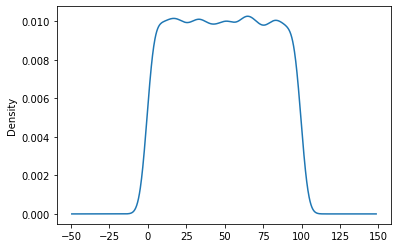

In [ ]:
tc.numdayscontractequipmentplanexpiring.plot(kind='kde')

9 **penaltytoswitch** - штраф за переключение.

In [ ]:
tc.penaltytoswitch.nunique(), tc.penaltytoswitch.unique()

(500, array([371,  43, 403,  76, 436, 108, 468, 141,   1, 173,  34, 206,  66,
        239,  99, 271, 131, 304, 164, 336, 196, 369, 229, 401, 261, 434,
        294, 466, 327, 499, 359,  32, 392,  64, 424,  97, 457, 129, 489,
        162,  22, 194,  54, 227,  87, 259, 120, 292, 152, 325, 361,  33,
        393, 426,  98, 459, 491,  24,  56,  89, 121, 154, 326, 186, 219,
        391, 252, 284, 317, 349, 382, 414, 447, 119, 479,  12, 184,  45,
        217,  77, 250, 110, 282, 142, 315, 175, 347, 207, 380, 240, 412,
        272, 445, 305, 477, 338,  10, 370,  75, 435, 140,   0, 205, 238,
        270, 303, 163, 368, 228, 433, 293, 498,  31,  63,  96, 456, 161,
         21, 226,  86, 291, 324, 356, 389, 249, 422, 454, 314, 487,  19,
        379,  52,  84, 117, 149, 182,  42, 215, 247, 107, 280, 312, 172,
        345, 377, 410, 442, 475, 335,   8,  40, 400,  73, 105, 465, 138,
        170, 203, 235, 268, 128, 301, 333, 193, 366, 398, 258, 431, 463,
        496,  28,  61, 421,  94, 126, 486, 159

In [ ]:
tc.penaltytoswitch.value_counts(ascending=False)

151    56
184    56
276    56
60     56
125    56
       ..
241    25
446    25
390    24
87     24
185    22
Name: penaltytoswitch, Length: 500, dtype: int64

10 **totalminsusedinlastmonth** - всего использованных минут за последний месяц.

In [ ]:
tc.totalminsusedinlastmonth.nunique(), tc.totalminsusedinlastmonth.unique()

(500, array([ 15, 212, 216, 412, 416, 113, 116, 313, 316,  13,  17, 214, 217,
        414, 417, 114, 118, 315, 318,  18, 215, 219, 419, 119, 320,  16,
         20, 220, 420, 117, 121, 321,  21, 218, 222, 422, 122, 319, 323,
        322,  19,  23, 223, 423, 120, 124, 324,  24, 221, 225, 425, 125,
        326,  22,  26, 226, 426, 123, 127, 327,  27, 224, 228, 428, 128,
        325, 329,  29, 229, 429, 126, 130, 330,  30, 227, 231, 431, 131,
        328, 332,  32, 232, 433, 133, 333,  33, 230, 234, 434, 134, 331,
        335,  35, 235, 432, 436, 136, 336,  37, 233, 237, 437, 137, 334,
        338,  38, 238, 435, 439, 139, 339,  36,  40, 240, 440, 140, 337,
        341,  41, 241, 438, 442, 142, 342,  39,  43, 243, 443, 144, 340,
        344,  44, 244, 441, 445, 145, 345,  42,  46, 246, 446, 143, 147,
        347,  47, 248, 444, 448, 148, 348,  45,  49, 249, 449, 146, 150,
        350,  50, 247, 251, 451, 151, 351,  48,  52, 252, 452, 149, 153,
        353,  53, 250, 254, 454, 154, 355,  51

In [ ]:
tc.totalminsusedinlastmonth.value_counts(ascending=False)

219    55
326    54
80     53
115    53
257    52
       ..
53     30
411    29
4      28
64     24
264    24
Name: totalminsusedinlastmonth, Length: 500, dtype: int64

11 **unpaidbalance** - неоплаченный остаток.

In [ ]:
tc.unpaidbalance.nunique(), tc.unpaidbalance.unique()

(250, array([ 19,  34, 144, 159, 143, 158,  18,  33,  68, 178, 193,  53,  52,
         67, 177, 192, 191,  51,  66, 176, 175, 190,  50,  65,  64, 174,
        189,  49,  48,  63, 173, 188, 187,  47,  62, 172, 186,  46,  61,
        171, 170, 185,  45,  60,  59, 169, 184,  44,  43,  58, 168, 183,
        218,  78,  93, 203, 202, 217,  77,  92,  91, 201, 216,  76,  75,
         90, 200, 215,  74,  89, 199, 214, 213,  73,  88, 198, 197, 212,
         72,  87,  86, 196, 211,  71,  70,  85, 195, 210, 209,  69,  84,
        194, 208,  83,  82, 207,  81, 206,  80, 205, 204,  79,  98, 113,
        223, 238,  97, 112, 222, 237, 236,  96, 111, 221, 233, 128, 163,
         23, 108,  38,   3, 148,  57, 182,  56, 181, 160,  20,  35, 145,
         55, 180, 179,  54, 104, 229, 103, 228, 227, 102, 232, 247, 107,
        122, 231, 246, 106, 121, 230, 245, 105, 120, 155,  15,  30, 140,
        100, 225, 119,  14,  29, 139, 154, 244, 118, 243, 242, 117, 116,
        226,  11,  95,  10,  25, 240, 135, 220

In [ ]:
tc.unpaidbalance.value_counts(ascending=False)

59     186
185    177
184    173
75     164
60     159
      ... 
28      21
154     20
226     19
153     18
101     14
Name: unpaidbalance, Length: 250, dtype: int64

12 **totalcallduration** - общая продолжительность вызова.

In [ ]:
tc.totalcallduration.nunique(), tc.totalcallduration.unique()

(7147, array([5971, 3981, 7379, ..., 3871, 7651, 7200]))

In [ ]:
tc.totalcallduration.value_counts(ascending=False)

1994    11
5301    11
3116    11
3785    11
3097    11
        ..
1956     1
8019     1
6621     1
7304     1
7200     1
Name: totalcallduration, Length: 7147, dtype: int64

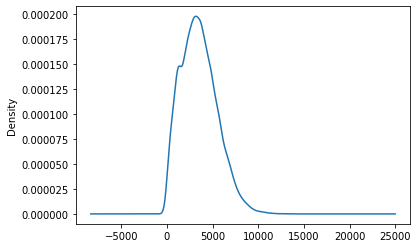

In [ ]:
tc.totalcallduration.plot(kind='kde')

13 **avgcallduration** - средняя продолжительность вызова.  
От минуты до часа разговаривают.

In [ ]:
tc.avgcallduration.nunique(), tc.avgcallduration.unique()

(1359, array([ 663,  995,  737, ...,  207, 1302, 1249]))

In [ ]:
tc.avgcallduration.value_counts(ascending=False)

739     60
708     55
652     55
713     54
681     53
        ..
1352     1
1258     1
27       1
1394     1
1249     1
Name: avgcallduration, Length: 1359, dtype: int64

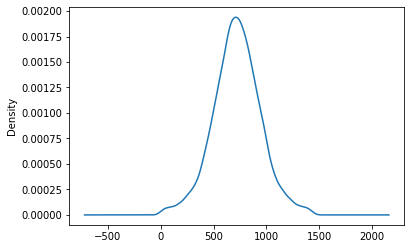

In [ ]:
tc.avgcallduration.plot(kind='kde')

**ЦЕЛЕВАЯ ПЕРЕМЕННАЯ** churn

14 **churn** - ОТТОК КЛИЕНТОВ.  
10 % примерно в оттоке (1/11).

In [ ]:
tc.churn.nunique(), tc.churn.unique()

(2, array([0, 1]))

In [ ]:
tc.churn.value_counts(ascending=False)

0    18605
1     1863
Name: churn, dtype: int64

15 **year** - год.  
Всего один год, можно **дропать колонку**.

In [ ]:
tc.year.nunique(), tc.year.unique()

(1, array([2015]))

In [ ]:
tc.year.value_counts(ascending=False)

2015    20468
Name: year, dtype: int64

16 **month** - месяц.  
Три месяца, скорей всего один неполный, по-хорошему, я бы удалил либо добавил значения в этот месяц, чтобы был **баланс классов**.

In [ ]:
tc.month.nunique(), tc.month.unique()

(3, array([1, 2, 3]))

In [ ]:
tc.month.value_counts(ascending=False)

1    9475
2    9466
3    1527
Name: month, dtype: int64

**float64**

1 **calldroprate** - частота отбрасывания вызовов.  
Довольно не понятно, почему равномерное частота отбрасывания вызовов. Пусть будет. Пока.

In [ ]:
tc.calldroprate.nunique(), tc.calldroprate.unique()

(8, array([0.06, 0.05, 0.07, 0.  , 0.01, 0.02, 0.03, 0.04]))

In [ ]:
tc.calldroprate.value_counts(ascending=False)

0.02    2595
0.07    2590
0.00    2587
0.06    2583
0.01    2539
0.05    2535
0.04    2533
0.03    2506
Name: calldroprate, dtype: int64

2 **callfailurerate** - частота отказов при вызове.

In [ ]:
tc.callfailurerate.nunique(), tc.callfailurerate.unique()

(4, array([0.  , 0.01, 0.02, 0.03]))

In [ ]:
tc.callfailurerate.value_counts(ascending=False)

0.03    5358
0.01    5191
0.02    4963
0.00    4956
Name: callfailurerate, dtype: int64

3 **percentagecalloutsidenetwork**

In [ ]:
tc.percentagecalloutsidenetwork.nunique(), tc.percentagecalloutsidenetwork.unique()

(100, array([0.82, 0.27, 0.48, 0.94, 0.15, 0.61, 0.28, 0.49, 0.16, 0.95, 0.83,
        0.81, 0.02, 0.69, 0.36, 0.03, 0.7 , 0.37, 0.04, 0.71, 0.5 , 0.17,
        0.38, 0.05, 0.84, 0.72, 0.51, 0.18, 0.39, 0.06, 0.85, 0.73, 0.52,
        0.4 , 0.19, 0.86, 0.07, 0.74, 0.53, 0.41, 0.2 , 0.87, 0.08, 0.75,
        0.54, 0.42, 0.21, 0.88, 0.09, 0.76, 0.55, 0.43, 0.22, 0.89, 0.1 ,
        0.77, 0.56, 0.44, 0.23, 0.11, 0.9 , 0.57, 0.78, 0.45, 0.24, 0.12,
        0.91, 0.58, 0.79, 0.46, 0.25, 0.13, 0.92, 0.59, 0.8 , 0.47, 0.26,
        0.14, 0.93, 0.6 , 0.62, 0.29, 0.96, 0.63, 0.3 , 0.97, 0.64, 0.31,
        0.98, 0.65, 0.32, 0.99, 0.66, 0.33, 0.  , 0.67, 0.34, 0.01, 0.68,
        0.35]))

In [ ]:
tc.percentagecalloutsidenetwork.value_counts()

0.45    258
0.57    256
0.56    254
0.78    246
0.23    245
       ... 
0.21    169
0.09    168
0.87    168
0.88    165
0.38    157
Name: percentagecalloutsidenetwork, Length: 100, dtype: int64

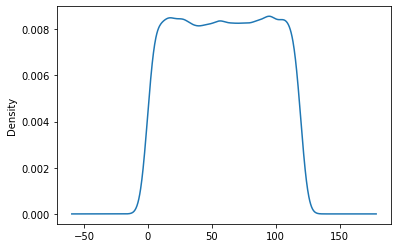

In [ ]:
tc.monthlybilledamount.plot(kind='kde')

#### **Моделирование**

**BASELINE**  
Запустим наш датасет, как есть и посмотрим какие у нас переменные важные.

##### **Подготовка данных**

Скопируем наш датафрейм в новую переменную.

In [ ]:
df = tc.copy()

Удалим разные колонки, которые обозначил для этого после того, как использовал PandasProfilling.

In [ ]:
columns_todel = ['noadditionallines', 'year', 'customerid']

df.drop(columns_todel, axis = 1, inplace=True)

**churn это отток**

In [ ]:
(df['churn'] == 1).sum()

1863

**Проведём кодирование категориальных переменных.**

In [ ]:
tc_categorical_columns

['customersuspended',
 'education',
 'gender',
 'homeowner',
 'maritalstatus',
 'noadditionallines',
 'occupation',
 'state',
 'usesinternetservice',
 'usesvoiceservice']

noadditionallines мы удалили . . .

Используем для state, чтобы не плодить много фич.

In [ ]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

df['state_le'] = le.fit_transform(df['state'])

df.drop(['state'], axis = 1, inplace = True)

get_dummies
все остальные.

In [ ]:
tc_categorical_columns

['customersuspended',
 'education',
 'gender',
 'homeowner',
 'maritalstatus',
 'noadditionallines',
 'occupation',
 'state',
 'usesinternetservice',
 'usesvoiceservice']

In [ ]:
customersuspended = pd.get_dummies(df['customersuspended'], prefix='customersuspended')
education = pd.get_dummies(df['education'], prefix='education')
gender = pd.get_dummies(df['gender'], prefix='gender')
homeowner = pd.get_dummies(df['homeowner'], prefix='homeowner')
maritalstatus = pd.get_dummies(df['maritalstatus'], prefix='maritalstatus')
occupation = pd.get_dummies(df['occupation'], prefix='occupation')
usesinternetservice = pd.get_dummies(df['usesinternetservice'], prefix='usesinternetservice')
usesvoiceservice = pd.get_dummies(df['usesvoiceservice'], prefix='usesvoiceservice')

In [ ]:
categoricalcolumns_todel = ['customersuspended', 'education', 'gender', 'homeowner', 'maritalstatus', 'occupation', 'usesinternetservice', 'usesvoiceservice']

df.drop(categoricalcolumns_todel, axis = 1, inplace=True)

Подстыкуем нужные колонки.

In [ ]:
df = pd.concat((customersuspended, df), axis=1)
df = pd.concat((education, df), axis=1)
df = pd.concat((gender, df), axis=1)
df = pd.concat((homeowner, df), axis=1)
df = pd.concat((maritalstatus, df), axis=1)
df = pd.concat((occupation, df), axis=1)
df = pd.concat((usesinternetservice, df), axis=1)
df = pd.concat((usesvoiceservice, df), axis=1)
df.head()

,usesvoiceservice_No,usesvoiceservice_Yes,usesinternetservice_No,usesinternetservice_Yes,occupation_Non-technology Related Job,occupation_Others,occupation_Technology Related Job,maritalstatus_Married,maritalstatus_Single,homeowner_No,...,numdayscontractequipmentplanexpiring,penaltytoswitch,totalminsusedinlastmonth,unpaidbalance,percentagecalloutsidenetwork,totalcallduration,avgcallduration,churn,month,state_le
0,1,0,1,0,0,0,1,0,1,0,...,96,371,15,19,0.82,5971,663,0,1,46
1,1,0,1,0,0,0,1,0,1,0,...,96,371,15,19,0.82,3981,995,0,2,46
2,0,1,1,0,0,0,1,0,1,0,...,14,43,212,34,0.27,7379,737,0,1,47
3,0,1,1,0,0,0,1,0,1,0,...,14,43,212,34,0.27,1729,432,0,2,47
4,1,0,1,0,0,0,1,0,1,0,...,55,403,216,144,0.48,3122,624,0,1,15


##### **Модель деревья решений (Random Forest)**

In [ ]:
df.sample(5)

,usesvoiceservice_No,usesvoiceservice_Yes,usesinternetservice_No,usesinternetservice_Yes,occupation_Non-technology Related Job,occupation_Others,occupation_Technology Related Job,maritalstatus_Married,maritalstatus_Single,homeowner_No,...,numdayscontractequipmentplanexpiring,penaltytoswitch,totalminsusedinlastmonth,unpaidbalance,percentagecalloutsidenetwork,totalcallduration,avgcallduration,churn,month,state_le
6806,1,0,1,0,1,0,0,0,1,0,...,51,106,491,196,0.66,5235,581,0,1,9
2947,1,0,1,0,0,1,0,0,1,0,...,25,426,322,75,0.83,1347,269,0,2,17
5265,1,0,1,0,0,1,0,1,0,1,...,71,409,386,188,0.06,2974,424,0,1,46
11947,1,0,1,0,0,1,0,1,0,0,...,91,107,354,136,0.63,4288,714,0,2,3
12286,1,0,1,0,0,0,1,1,0,1,...,87,69,279,209,0.01,3759,537,0,1,27


In [ ]:
df.shape

(20468, 37)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20468 entries, 0 to 20467
Data columns (total 37 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   usesvoiceservice_No                    20468 non-null  uint8  
 1   usesvoiceservice_Yes                   20468 non-null  uint8  
 2   usesinternetservice_No                 20468 non-null  uint8  
 3   usesinternetservice_Yes                20468 non-null  uint8  
 4   occupation_Non-technology Related Job  20468 non-null  uint8  
 5   occupation_Others                      20468 non-null  uint8  
 6   occupation_Technology Related Job      20468 non-null  uint8  
 7   maritalstatus_Married                  20468 non-null  uint8  
 8   maritalstatus_Single                   20468 non-null  uint8  
 9   homeowner_No                           20468 non-null  uint8  
 10  homeowner_Yes                          20468 non-null  uint8  
 11  ge

Отделим целевую переменную от других переменных.

In [117]:
import sklearn
from sklearn.preprocessing import StandardScaler

In [118]:
features = df.drop(columns=['churn']).columns
sc = StandardScaler()
X = pd.DataFrame(sc.fit_transform(df), columns=df.columns)

In [119]:
X_train, X_test, y_train, y_test = train_test_split(X.drop(columns=['churn']), 
                                                    X['churn'], 
                                                    test_size=0.1)
X_train, X_dev, y_train, y_dev = train_test_split(X_train, 
                                                  y_train, 
                                                  test_size=0.1)
print('Train:', X_train.shape, y_train.shape)
print('Dev:', X_dev.shape, y_dev.shape)
print('Test:', X_test.shape, y_test.shape)

Train: (16578, 36) (16578,)
Dev: (1843, 36) (1843,)
Test: (2047, 36) (2047,)


In [132]:
#from sklearn.model_selection import train_test_split
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=45) 

In [133]:
from sklearn.ensemble import RandomForestClassifier

# создаем модель деревья решений
# выбираем 100 деревьев в качестве параметра
model_RFC = RandomForestClassifier(n_estimators=100)

# обучаем модель
model_RFC.fit(X_train,y_train)

RandomForestClassifier()

No handles with labels found to put in legend.


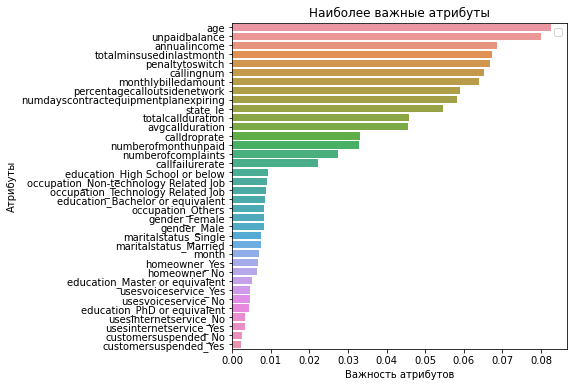

In [ ]:
headers = list(X_train.columns.values)

feature_imp = pd.Series(model.feature_importances_,index=headers).sort_values(ascending=False)

f, ax = plt.subplots(figsize=(6, 6))
sns.barplot(x=feature_imp, y=feature_imp.index)

plt.xlabel('Важность атрибутов')
plt.ylabel('Атрибуты')
plt.title("Наиболее важные атрибуты")
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import classification_report

modelpred_RFC = model_RFC.predict(X_test)
print(classification_report(y_test, model_pred))
model_RFC.score(X_test, y_test)

              precision    recall  f1-score   support

           0       0.94      1.00      0.97      5568
           1       1.00      0.37      0.54       573

    accuracy                           0.94      6141
   macro avg       0.97      0.69      0.76      6141
weighted avg       0.95      0.94      0.93      6141



0.9454486240026054

Средняя точность модели 0.94.

А вот и предсказание на тестовой выборке для двух классов:

In [ ]:
model_RFC.predict_proba(X_test)

array([[0.98, 0.02],
       [0.88, 0.12],
       [0.95, 0.05],
       ...,
       [0.94, 0.06],
       [1.  , 0.  ],
       [0.98, 0.02]])

In [ ]:
y_pred = model_RFC.predict(X_test)
print('Таблица предсказания:')
pd.DataFrame({'True': y_test.round(3), '\'Predicted\'': y_pred.round(3)})

Таблица предсказания:


,True,'Predicted'
15113,0,0
19365,0,0
1310,0,0
2097,0,0
3702,0,0
...,...,...
14779,0,0
6288,0,0
923,0,0
5897,0,0


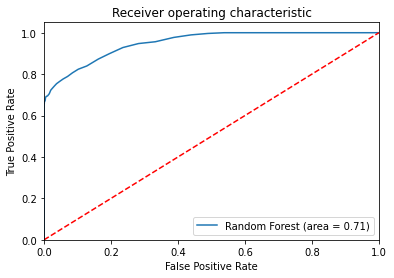

In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, model_RFC.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, model_RFC.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Random Forest (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('RF_ROC')
plt.show()

##### Gaussian_NB

In [ ]:
from sklearn.naive_bayes import GaussianNB

In [ ]:
model_GNB = GaussianNB()

# обучаем модель
model_GNB.fit(X_train,y_train)

GaussianNB()

In [ ]:
from sklearn.metrics import classification_report

modelpred_GNB = model_GNB.predict(X_test)
print(classification_report(y_test, modelpred_GNB))
model_GNB.score(X_test, y_test)

              precision    recall  f1-score   support

           0       0.91      0.99      0.95      5568
           1       0.13      0.01      0.02       573

    accuracy                           0.90      6141
   macro avg       0.52      0.50      0.48      6141
weighted avg       0.83      0.90      0.86      6141



0.9000162839928351

**Добавим ещё библиотек и моделей.**

In [114]:
from sklearn.linear_model import Ridge, LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR

from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RandomizedSearchCV

from sklearn.metrics import mean_absolute_error, mean_squared_error

#####Ridge - модель с L2-регуляризаций

In [120]:
params = {'alpha':list(np.arange(0.1, 100.0, 0.1)),
          'max_iter':[500, 1000, 2000, 5000, 10000],
          'tol':[1e-3, 1e-2, 1e-4, 1e-5],
          'solver':['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']          
          }

lin_reg = RandomizedSearchCV(Ridge(), params, cv=10, n_jobs=-1, random_state=45, n_iter=30)
lin_reg = lin_reg.fit(X_train, y_train).best_estimator_
lin_reg

Ridge(alpha=80.1, max_iter=500, solver='sparse_cg', tol=0.01)

In [121]:
pd.DataFrame({'True': y_dev, 'Predicted': lin_reg.predict(X_dev), 'Deviation, %': (y_dev-lin_reg.predict(X_dev))/lin_reg.predict(X_dev)})

,True,Predicted,"Deviation, %"
15814,-0.316440,0.209044,-2.513751
4076,-0.316440,0.300678,-2.052421
5335,-0.316440,-0.067711,3.673422
16073,-0.316440,0.211578,-2.495620
17449,3.160155,0.095358,32.139853
...,...,...,...
4987,-0.316440,-0.070626,3.480477
1699,-0.316440,0.340741,-1.928683
12179,-0.316440,-0.350035,-0.095975
14111,-0.316440,-0.146416,1.161246


In [122]:
print('\nМетрики модели:\n')
print('MSE:', np.sqrt(mean_squared_error(y_dev, lin_reg.predict(X_dev))))
print('MAE:', mean_absolute_error(y_dev, lin_reg.predict(X_dev)))


Метрики модели:

MSE: 0.9661529553572288
MAE: 0.5504223014564229


In [123]:
pd.Series(lin_reg.coef_, index = features).abs().sort_values(ascending=False).head(10)

age                                      0.137335
numberofcomplaints                       0.060500
unpaidbalance                            0.039788
numdayscontractequipmentplanexpiring     0.022421
education_Master or equivalent           0.017006
percentagecalloutsidenetwork             0.016749
monthlybilledamount                      0.015091
callingnum                               0.013711
numberofmonthunpaid                      0.011202
occupation_Non-technology Related Job    0.011070
dtype: float64

Согласно этой модели на целевую переменную (отток клиентов) влияет возраст.

##### RandomForestRegressor - модель

In [124]:
params = {   'criterion': ['mse', 'mae'],
             'max_depth': list(range(5, 20, 1)),
             'max_features': ['auto', 'sqrt', 'log2'],
             'min_samples_leaf': list(range(1, 8, 1)),
             'min_samples_split': list(range(2, 8, 1)),
             'n_estimators': list(range(5, 20, 1)),
             'n_jobs': [-1],
             'random_state': [13]}

rf_regr = RandomizedSearchCV(RandomForestRegressor(), params, cv=6, n_jobs=-1, n_iter=10, random_state=13)
rf_regr =  rf_regr.fit(X_train, y_train).best_estimator_
rf_regr

RandomForestRegressor(criterion='mse', max_depth=18, max_features='sqrt',
                      min_samples_leaf=2, min_samples_split=4, n_estimators=9,
                      n_jobs=-1, random_state=13)

In [125]:
pd.DataFrame({'Actual': y_dev, 'Predicted': rf_regr.predict(X_dev), 'Deviation, %': (y_dev-rf_regr.predict(X_dev))/rf_regr.predict(X_dev)})

,Actual,Predicted,"Deviation, %"
15814,-0.316440,-0.123296,1.566508e+00
4076,-0.316440,0.501582,-1.630884e+00
5335,-0.316440,-0.274090,1.545135e-01
16073,-0.316440,0.033472,-1.045381e+01
17449,3.160155,0.451699,5.996145e+00
...,...,...,...
4987,-0.316440,-0.316440,-5.262716e-15
1699,-0.316440,-0.316440,3.508477e-16
12179,-0.316440,-0.161925,9.542414e-01
14111,-0.316440,-0.316440,-4.385596e-15


In [126]:
print('MSE:', np.sqrt(mean_squared_error(y_dev, rf_regr.predict(X_dev))))
print('MAE:', mean_absolute_error(y_dev, rf_regr.predict(X_dev)))

MSE: 0.7820345149950341
MAE: 0.4188899567855636


In [127]:
pd.Series(rf_regr.feature_importances_, index=features).sort_values(ascending=False).head(10)

age                                     0.099003
unpaidbalance                           0.077384
callingnum                              0.074639
annualincome                            0.068647
monthlybilledamount                     0.064312
penaltytoswitch                         0.064235
percentagecalloutsidenetwork            0.062787
numdayscontractequipmentplanexpiring    0.062106
totalminsusedinlastmonth                0.061991
state_le                                0.049991
dtype: float64

##### Используем стекинг моделей

In [128]:
Stack_regressor = StackingRegressor(
    [
        ('dt', RandomForestRegressor(n_estimators=28, min_samples_leaf=5, min_samples_split=7, max_depth=8,
                                     random_state=13)),
        ('svr', SVR())
    ],
Ridge(alpha=10.8, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, random_state=None, solver='sag', tol=0.001))

In [129]:
Stack_regressor = Stack_regressor.fit(X_train, y_train)

In [130]:
print('MSE')
print(np.sqrt(mean_squared_error(y_dev, Stack_regressor.predict(X_dev))))
print('MAE')
print(mean_absolute_error(y_dev, Stack_regressor.predict(X_dev)))

MSE
0.8836962337129884
MAE
0.5481600572870235


Резюмируем:

**Для RandomForestClassifier score получился 0,94  
Для GaussianNB score 0,9**

Все модели по важности фич показывают, что возраст (age) больше всего влияет на отток клиентов. Также разные модели в качестве второго параметра, влияющего на отток показывают то unpaidbalance, то numberofcomplaints.  
Что примечательно, тепловая карта в PandasProfilling также показала данную особенность.  

Влияют на отток клиентов:

**age** - возраст.

**unpaidbalance** - неоплаченный остаток.

**numberofmonthunpaid** - количество неоплаченных месяцев.